In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
# Control warnings
import warnings; warnings.simplefilter('ignore')

import os
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

import torch
import anndata

import plotly.express as px
import plotly.graph_objects as go

import plotly.express as px
import plotly.graph_objects as go
from anndata import AnnData
from umap import UMAP
from fastTSNE import TSNE
import plotnine as p
import datetime 
from fastTSNE.callbacks import ErrorLogger

import scvi
scvi.__version__

'0.7.0a6'

In [2]:
adata = anndata.read('allard_unfiltered_nuclei.h5ad')


In [3]:
fadata = anndata.read('allard_55007_filtered_nuclei.h5ad')


In [9]:
adata.obs['retained']= adata.obs.index.isin(fadata.obs.index)
adata.obs['retained']     

AAACCCAAGAAACACT-1-x12    False
AAACCCAAGAAGATCT-1-x12    False
AAACCCAAGAAGCTGC-1-x12    False
AAACCCAAGAAGGGAT-1-x12    False
AAACCCAAGAATAACC-1-x12    False
                          ...  
TTTGTTGTCTTGTGCC-1-x06    False
TTTGTTGTCTTTCCAA-1-x06    False
TTTGTTGTCTTTCGAT-1-x06    False
TTTGTTGTCTTTCTAG-1-x06    False
TTTGTTGTCTTTGCTA-1-x06    False
Name: retained, Length: 13980718, dtype: bool

In [10]:
adata.obs['retained'] .sum()

55007

In [11]:
adata.obs

,shortname,experiment_id,experiment_type,control,fastq_folder,barcode,retained
AAACCCAAGAAACACT-1-x12,x12_ethanol05,x12,ethanol05,ethanol,Allard_2_3_trial_2_F3Ethanol0_5percent,AAACCCAAGAAACACT-1,False
AAACCCAAGAAGATCT-1-x12,x12_ethanol05,x12,ethanol05,ethanol,Allard_2_3_trial_2_F3Ethanol0_5percent,AAACCCAAGAAGATCT-1,False
AAACCCAAGAAGCTGC-1-x12,x12_ethanol05,x12,ethanol05,ethanol,Allard_2_3_trial_2_F3Ethanol0_5percent,AAACCCAAGAAGCTGC-1,False
AAACCCAAGAAGGGAT-1-x12,x12_ethanol05,x12,ethanol05,ethanol,Allard_2_3_trial_2_F3Ethanol0_5percent,AAACCCAAGAAGGGAT-1,False
AAACCCAAGAATAACC-1-x12,x12_ethanol05,x12,ethanol05,ethanol,Allard_2_3_trial_2_F3Ethanol0_5percent,AAACCCAAGAATAACC-1,False
...,...,...,...,...,...,...,...
TTTGTTGTCTTGTGCC-1-x06,x06_water,x06,water,control,Allard_1_27_trial_1_F3water,TTTGTTGTCTTGTGCC-1,False
TTTGTTGTCTTTCCAA-1-x06,x06_water,x06,water,control,Allard_1_27_trial_1_F3water,TTTGTTGTCTTTCCAA-1,False
TTTGTTGTCTTTCGAT-1-x06,x06_water,x06,water,control,Allard_1_27_trial_1_F3water,TTTGTTGTCTTTCGAT-1,False
TTTGTTGTCTTTCTAG-1-x06,x06_water,x06,water,control,Allard_1_27_trial_1_F3water,TTTGTTGTCTTTCTAG-1,False


In [16]:
shortname='x12_ethanol05'
sel = adata[adata.obs.shortname==shortname].copy()
sel

AnnData object with n_obs × n_vars = 394453 × 20191
    obs: 'shortname', 'experiment_id', 'experiment_type', 'control', 'fastq_folder', 'barcode', 'retained'
    var: 'gene_id', 'gene_name'

In [17]:
scvi.data.poisson_gene_selection(sel)

Sampling from binomial...: 100%|██████████| 10000/10000 [00:00<00:00, 10127.42it/s]


In [18]:
sel

AnnData object with n_obs × n_vars = 394453 × 20191
    obs: 'shortname', 'experiment_id', 'experiment_type', 'control', 'fastq_folder', 'barcode', 'retained'
    var: 'gene_id', 'gene_name', 'highly_variable', 'observed_fraction_zeros', 'expected_fraction_zeros', 'prob_zero_enriched_nbatches', 'prob_zero_enrichment', 'prob_zero_enrichment_rank'
    uns: 'hvg'

In [21]:
sel.obs

,shortname,experiment_id,experiment_type,control,fastq_folder,barcode,retained
AAACCCAAGAAACACT-1-x12,x12_ethanol05,x12,ethanol05,ethanol,Allard_2_3_trial_2_F3Ethanol0_5percent,AAACCCAAGAAACACT-1,False
AAACCCAAGAAGATCT-1-x12,x12_ethanol05,x12,ethanol05,ethanol,Allard_2_3_trial_2_F3Ethanol0_5percent,AAACCCAAGAAGATCT-1,False
AAACCCAAGAAGCTGC-1-x12,x12_ethanol05,x12,ethanol05,ethanol,Allard_2_3_trial_2_F3Ethanol0_5percent,AAACCCAAGAAGCTGC-1,False
AAACCCAAGAAGGGAT-1-x12,x12_ethanol05,x12,ethanol05,ethanol,Allard_2_3_trial_2_F3Ethanol0_5percent,AAACCCAAGAAGGGAT-1,False
AAACCCAAGAATAACC-1-x12,x12_ethanol05,x12,ethanol05,ethanol,Allard_2_3_trial_2_F3Ethanol0_5percent,AAACCCAAGAATAACC-1,False
...,...,...,...,...,...,...,...
TTTGTTGTCTGCTAGG-1-x12,x12_ethanol05,x12,ethanol05,ethanol,Allard_2_3_trial_2_F3Ethanol0_5percent,TTTGTTGTCTGCTAGG-1,False
TTTGTTGTCTTAGGAC-1-x12,x12_ethanol05,x12,ethanol05,ethanol,Allard_2_3_trial_2_F3Ethanol0_5percent,TTTGTTGTCTTAGGAC-1,False
TTTGTTGTCTTCGTGC-1-x12,x12_ethanol05,x12,ethanol05,ethanol,Allard_2_3_trial_2_F3Ethanol0_5percent,TTTGTTGTCTTCGTGC-1,False
TTTGTTGTCTTGTTAC-1-x12,x12_ethanol05,x12,ethanol05,ethanol,Allard_2_3_trial_2_F3Ethanol0_5percent,TTTGTTGTCTTGTTAC-1,False


In [23]:
df = sel.var
df.sort_values('prob_zero_enrichment', ascending=False)

,gene_id,gene_name,highly_variable,observed_fraction_zeros,expected_fraction_zeros,prob_zero_enriched_nbatches,prob_zero_enrichment,prob_zero_enrichment_rank
vit-6,WBGene00006930,vit-6,True,0.819221,0.812932,1,0.1534,20190.0
vit-2,WBGene00006926,vit-2,True,0.822970,0.816053,1,0.1533,20189.0
col-140,WBGene00000713,col-140,True,0.847528,0.834905,1,0.1418,20188.0
eef-1A.1,WBGene00001168,eef-1A.1,True,0.832107,0.835352,1,0.1381,20187.0
col-124,WBGene00000698,col-124,True,0.854054,0.842323,1,0.1378,20186.0
...,...,...,...,...,...,...,...,...
C32B5.15,WBGene00016308,C32B5.15,False,0.999982,0.999982,0,0.0000,1794.0
H39E20.1,WBGene00019267,H39E20.1,False,0.999975,0.999975,0,0.0000,790.0
ZK402.5,WBGene00022731,ZK402.5,False,0.999921,0.999920,0,0.0000,789.0
irld-44,WBGene00019392,irld-44,False,1.000000,1.000000,0,0.0000,4633.0


In [26]:
# Calculate per gene mean
df['mean_'] = np.array(sel.X.mean(0))[0]

In [47]:
shortname='x12_ethanol05'
sel = adata[adata.obs.shortname==shortname].copy()
scvi.data.poisson_gene_selection(sel, n_samples = 20000)

Sampling from binomial...: 100%|██████████| 20000/20000 [00:01<00:00, 11926.91it/s]


In [45]:
sel.var

,gene_id,gene_name,highly_variable,observed_fraction_zeros,expected_fraction_zeros,prob_zero_enriched_nbatches,prob_zero_enrichment,prob_zero_enrichment_rank
B0348.5,WBGene00015153,B0348.5,False,0.999970,0.999964,0,0.000025,5580.0
ife-3,WBGene00002061,ife-3,True,0.996263,0.996301,1,0.004025,17428.0
B0348.10,WBGene00255704,B0348.10,False,0.999932,0.999929,0,0.000037,6588.0
egl-8,WBGene00001177,egl-8,True,0.996583,0.995767,1,0.004387,17712.0
B0348.2,WBGene00015152,B0348.2,False,0.999957,0.999957,0,0.000050,6988.0
...,...,...,...,...,...,...,...,...
nduo-4,WBGene00010963,nduo-4,True,0.957252,0.961072,1,0.036962,19975.0
ctc-1,WBGene00010964,ctc-1,True,0.886539,0.894911,1,0.091850,20158.0
ctc-2,WBGene00010965,ctc-2,True,0.910697,0.918685,1,0.073975,20118.0
nduo-3,WBGene00010966,nduo-3,True,0.971946,0.974824,1,0.024250,19849.0


In [50]:
adata.obs.shortname==shortname

AAACCCAAGAAACACT-1-x12     True
AAACCCAAGAAGATCT-1-x12     True
AAACCCAAGAAGCTGC-1-x12     True
AAACCCAAGAAGGGAT-1-x12     True
AAACCCAAGAATAACC-1-x12     True
                          ...  
TTTGTTGTCTTGTGCC-1-x06    False
TTTGTTGTCTTTCCAA-1-x06    False
TTTGTTGTCTTTCGAT-1-x06    False
TTTGTTGTCTTTCTAG-1-x06    False
TTTGTTGTCTTTGCTA-1-x06    False
Name: shortname, Length: 13980718, dtype: bool

In [54]:
adata[(adata.obs.shortname==shortname) & (adata.obs.retained==True)]

View of AnnData object with n_obs × n_vars = 1576 × 20191
    obs: 'shortname', 'experiment_id', 'experiment_type', 'control', 'fastq_folder', 'barcode', 'retained'
    var: 'gene_id', 'gene_name'

In [62]:
np.sort(adata.obs.shortname.unique())

array(['x01_control', 'x02_control', 'x03_ethanol005', 'x04_water',
       'x05_ethanol005', 'x06_water', 'x07_ethanol05', 'x08_water',
       'x09_control', 'x10_control', 'x11_control', 'x12_ethanol05',
       'x13_water', 'x14_ethanol005', 'x15_ethanol05', 'x16_water',
       'x17_ethanol05', 'x18_water', 'x19_ethanol005', 'x20_ethanol05',
       'x21_water'], dtype=object)

Sampling from binomial...: 100%|██████████| 20000/20000 [00:01<00:00, 11952.52it/s]


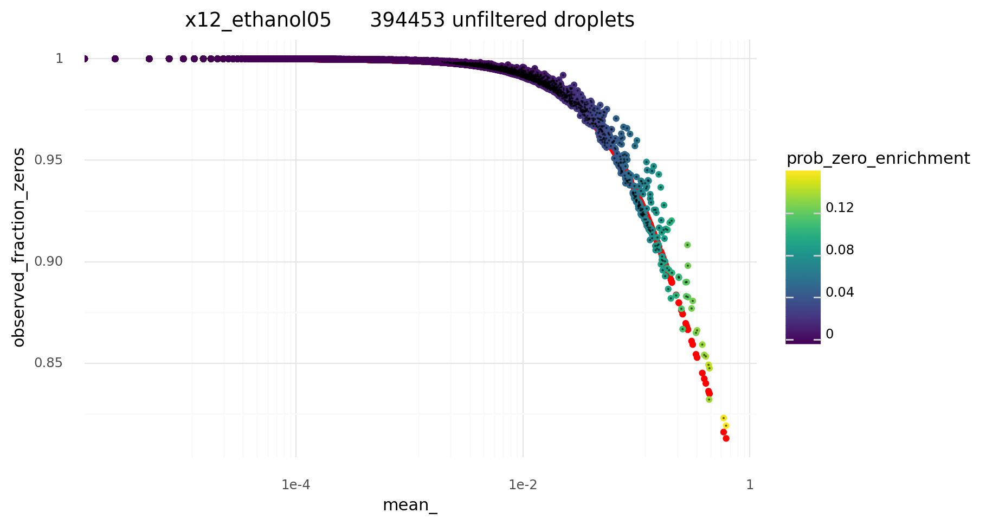

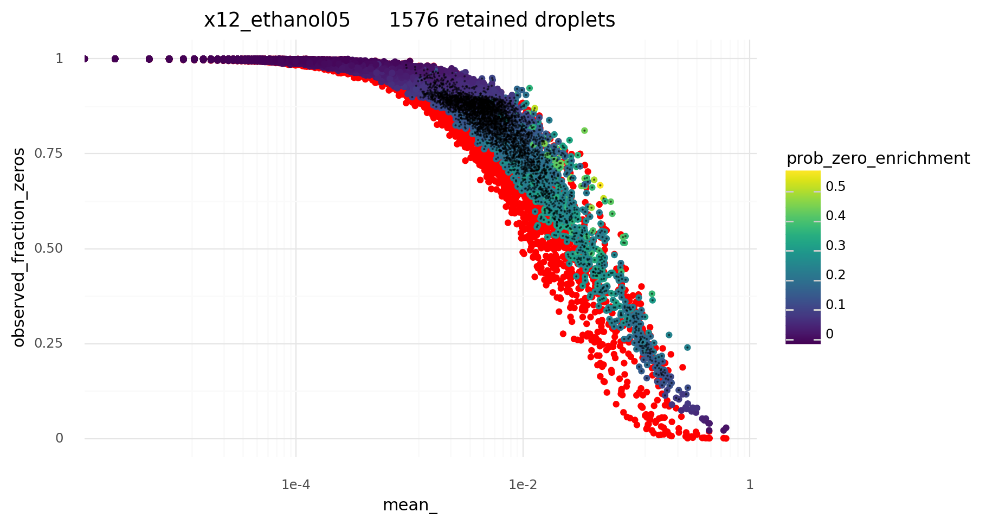

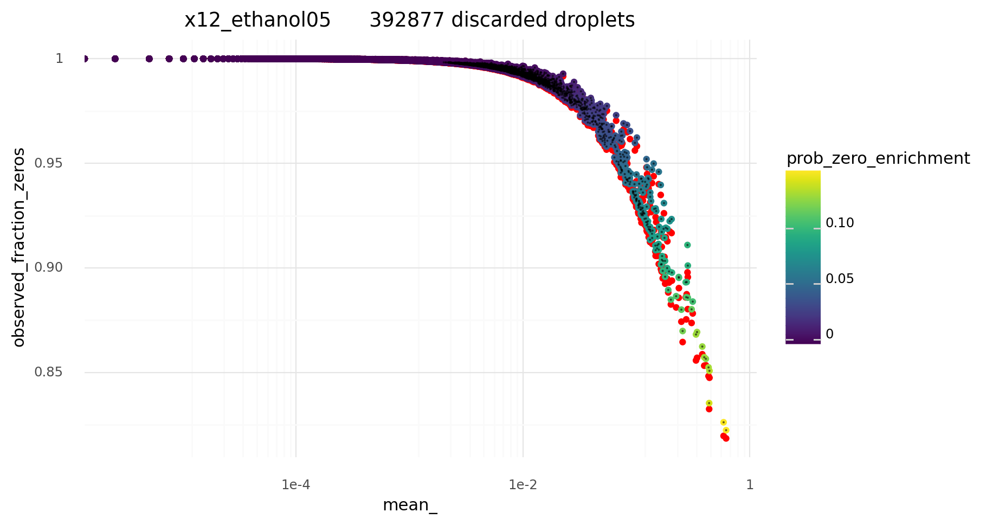

In [63]:
shortname='x12_ethanol05'
ads={}

ads['unfiltered']= adata[adata.obs.shortname==shortname].copy()
scvi.data.poisson_gene_selection(ads['unfiltered'], n_samples = 20000)
ads['retained']= adata[(adata.obs.shortname==shortname) & (adata.obs.retained==True)].copy()
scvi.data.poisson_gene_selection(ads['retained'], n_samples = 20000)
ads['discarded']= adata[(adata.obs.shortname==shortname) & (adata.obs.retained==False)].copy()
scvi.data.poisson_gene_selection(ads['discarded'], n_samples = 20000)

for cat in ['unfiltered','retained','discarded']:
    df = ads[cat].var

    df['mean_'] = np.array(sel.X.mean(0))[0]

    p.options.figure_size = (8, 5)
    pt=(
        p.ggplot(p.aes(x='mean_', y='observed_fraction_zeros', color='prob_zero_enrichment'), df)
        + p.geom_point(p.aes(y='expected_fraction_zeros'), color='r')
        + p.geom_point()
        + p.geom_point(data=df.query('highly_variable'), shape='.', size=0.2, color='k', alpha=0.5)
        + p.scale_x_log10()
        + p.theme_minimal()
        + p.labels.ggtitle(shortname + '      ' + str(len(ads[cat].obs)) + ' ' + cat + ' droplets')
    )
    pt.draw()

 ======================== x01_control ==============================
Sampling from binomial...: 100%|██████████| 80000/80000 [00:06<00:00, 11653.35it/s]
x01_control      305536 unfiltered droplets
x01_control      2219 retained droplets
x01_control      303317 discarded droplets
 ======================== x02_control ==============================
Sampling from binomial...: 100%|██████████| 80000/80000 [00:07<00:00, 11406.41it/s]
x02_control      357922 unfiltered droplets
x02_control      1111 retained droplets
x02_control      356811 discarded droplets
 ======================== x03_ethanol005 ==============================
Sampling from binomial...: 100%|██████████| 80000/80000 [00:07<00:00, 11291.13it/s]
x03_ethanol005      577623 unfiltered droplets
x03_ethanol005      1689 retained droplets
x03_ethanol005      575934 discarded droplets
 ======================== x04_water ==============================
Sampling from binomial...: 100%|██████████| 80000/80000 [00:06<00:00, 11658.31it/

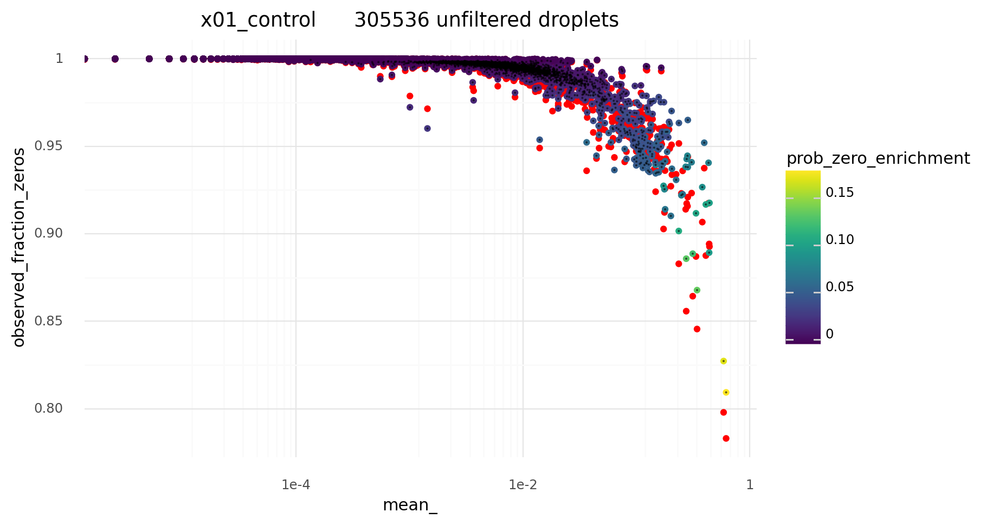

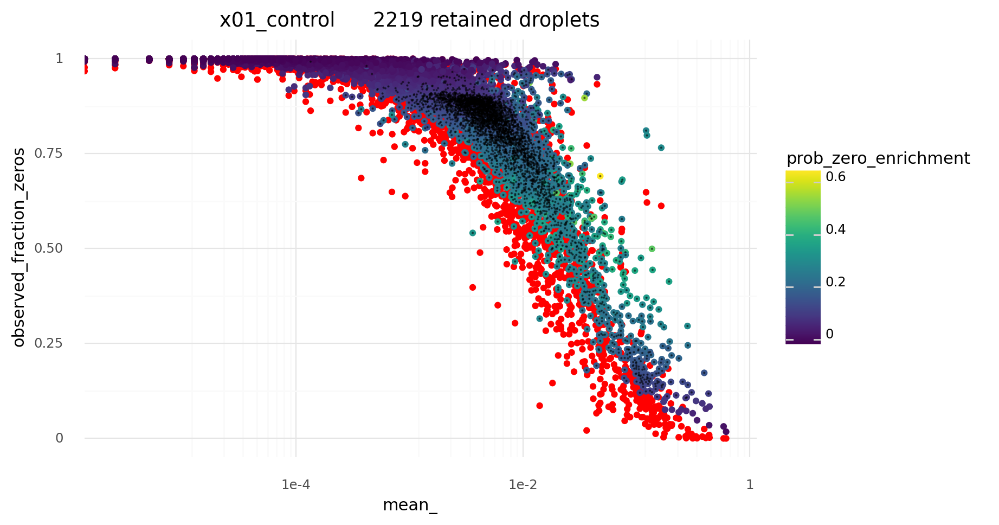

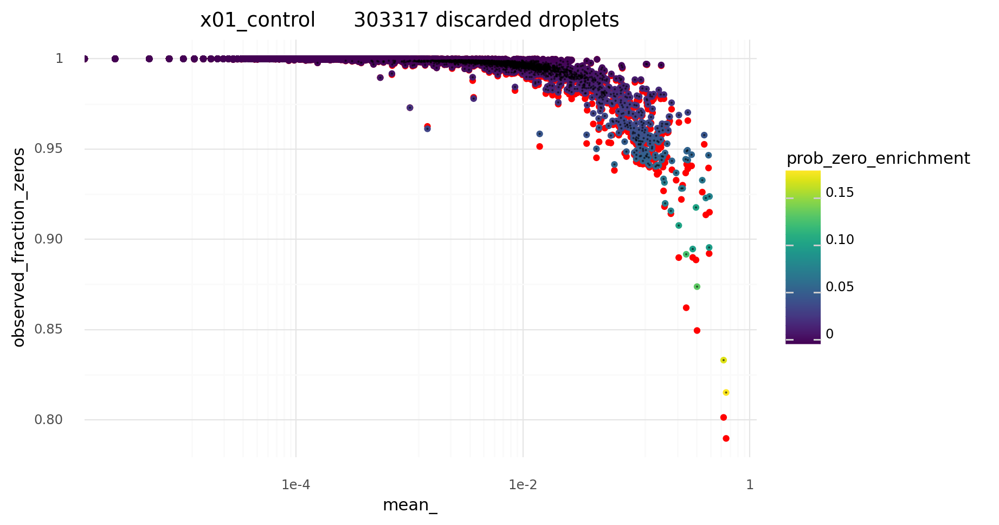

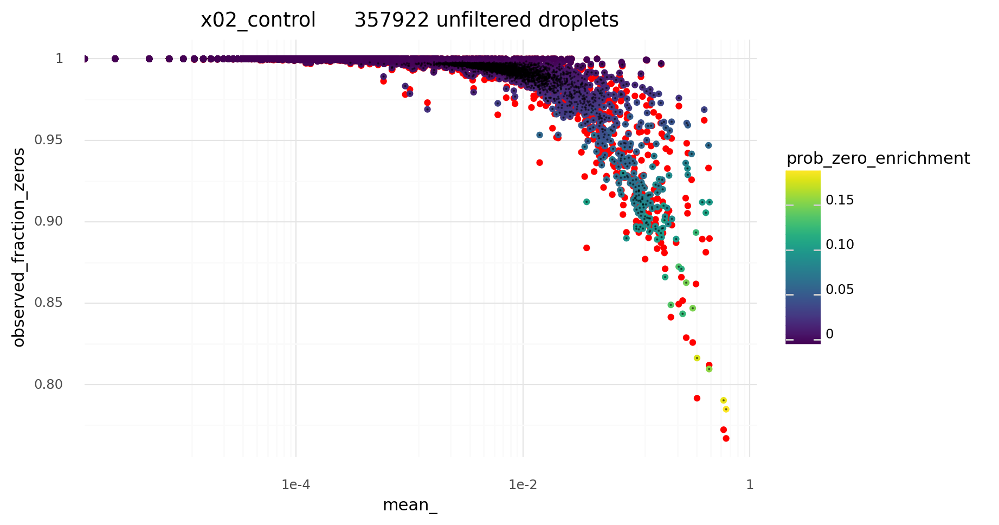

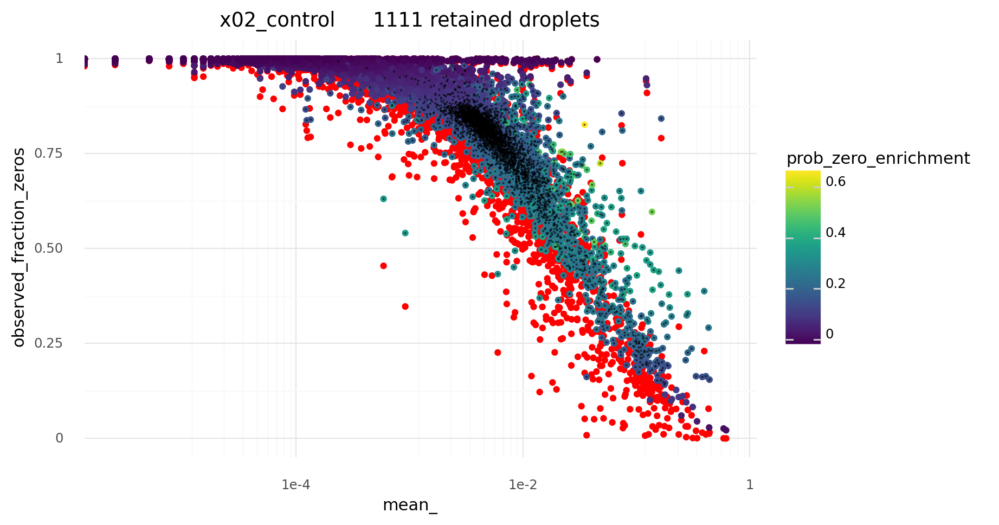

...

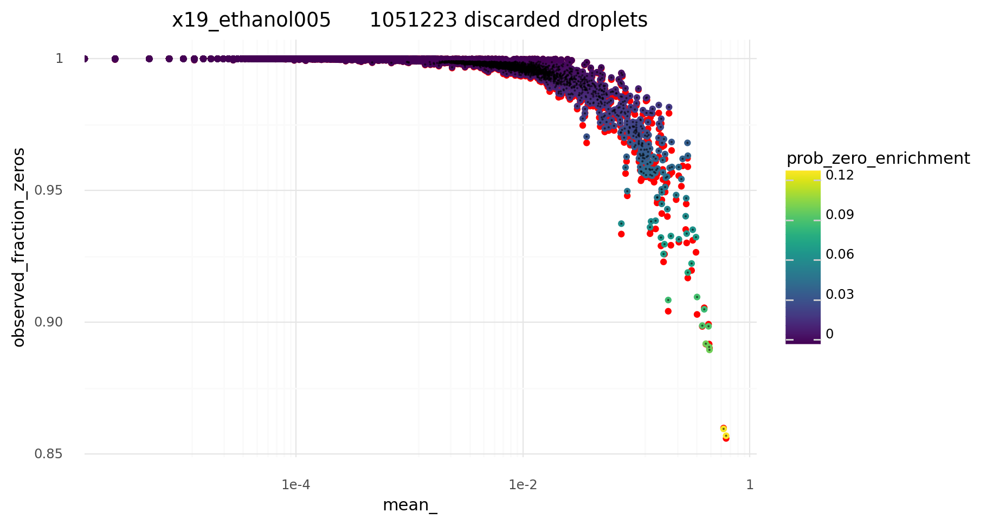

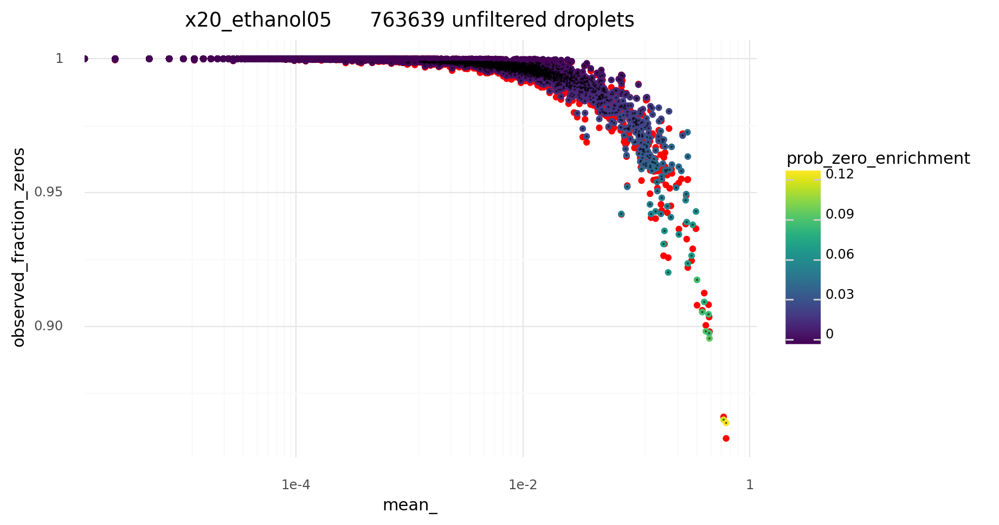

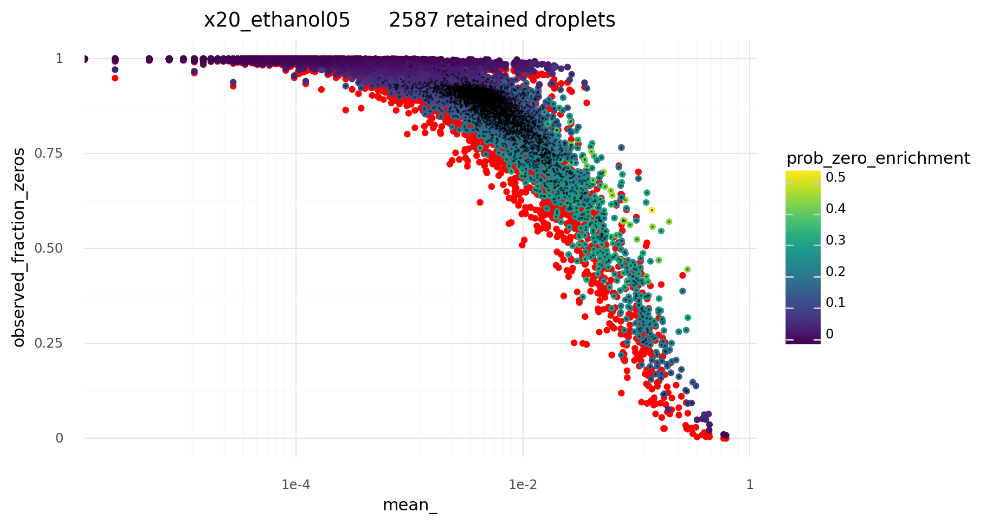

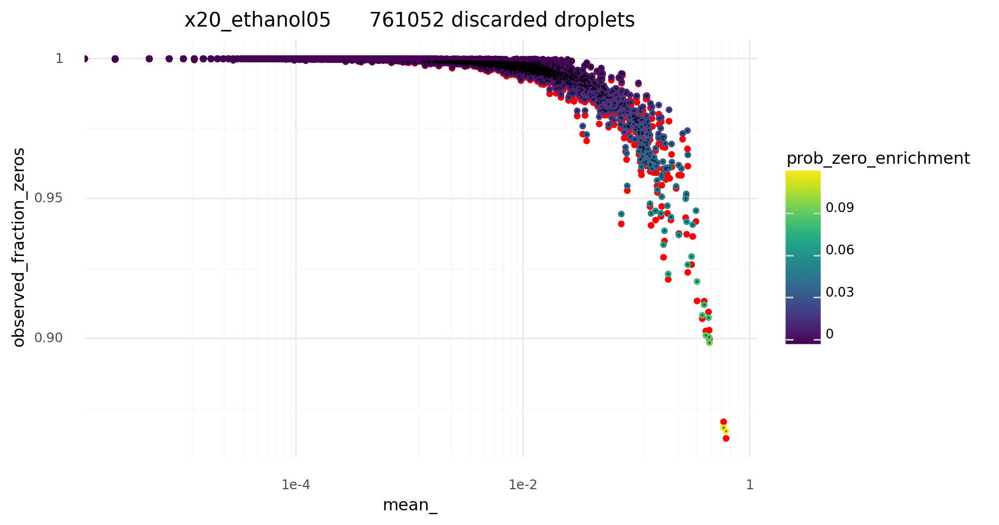

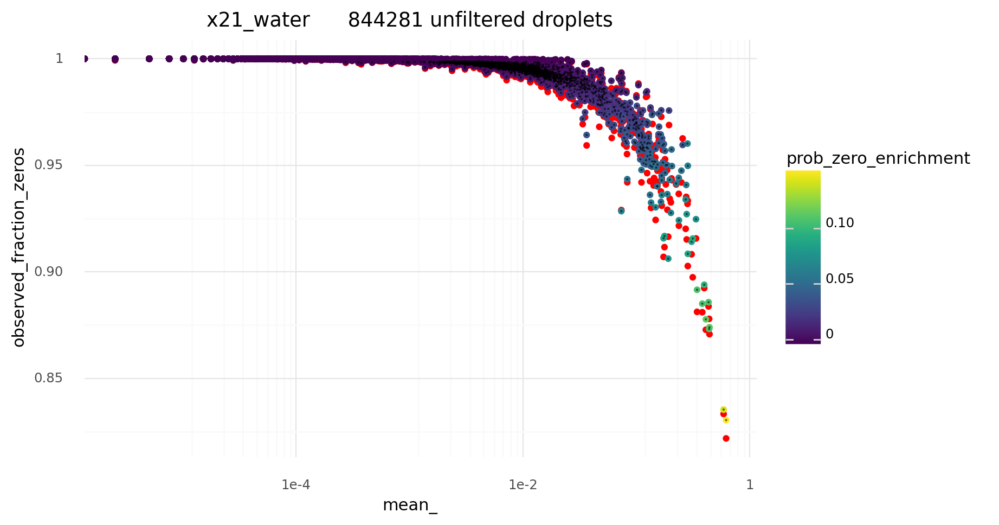

In [ ]:
%matplotlib notebook
%matplotlib inline 
for shortname in np.sort(adata.obs.shortname.unique()):
    print(f' ======================== {shortname} ==============================')
    ads={}

    ads['unfiltered']= adata[adata.obs.shortname==shortname].copy()
    scvi.data.poisson_gene_selection(ads['unfiltered'], n_samples = 80000)
    ads['retained']= adata[(adata.obs.shortname==shortname) & (adata.obs.retained==True)].copy()
    scvi.data.poisson_gene_selection(ads['retained'], n_samples = 80000)
    ads['discarded']= adata[(adata.obs.shortname==shortname) & (adata.obs.retained==False)].copy()
    scvi.data.poisson_gene_selection(ads['discarded'], n_samples = 80000)

    for cat in ['unfiltered','retained','discarded']:
        title=shortname + '      ' + str(len(ads[cat].obs)) + ' ' + cat + ' droplets'
        print(title)
        df = ads[cat].var

        df['mean_'] = np.array(sel.X.mean(0))[0]

        p.options.figure_size = (8, 5)
        pt=(
            p.ggplot(p.aes(x='mean_', y='observed_fraction_zeros', color='prob_zero_enrichment'), df)
            + p.geom_point(p.aes(y='expected_fraction_zeros'), color='r')
            + p.geom_point()
            + p.geom_point(data=df.query('highly_variable'), shape='.', size=0.2, color='k', alpha=0.5)
            + p.scale_x_log10()
            + p.theme_minimal()
            + p.labels.ggtitle(title)
        )
        pt.draw()
        
    

In [ ]:
pt.draw()